In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader

import torchvision.transforms as transforms
import torchvision.utils
from torchvision.utils import make_grid

import torchvision.datasets

import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (10,6)

from tqdm import tqdm

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


# Introduction to Generative Adversarial Networks (GANs)

In this notebook you will build a GAN from scratch, grossly following the DCGAN architecture.

**Goals:**


1.   Build a GAN arhictecture from scratch
2.   Write the GAN loss function and train GAN from scratch
3.   Have experience with some of the instability problems inherent with training GANs.
4.   [Bonus] Extend the unconditional GAN into a conditional GAN.



## 1. Getting Started

We will work with the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset. It contains 60,000 images size 28x28 of handwritten digits, from 0 to 9.

## 1. Dataloading

### 1.1 Define some hyperparameters and transforms


In [ ]:
batch_size = 128 # Images per batch

# Resize to 32x32 for easier upsampling/downsampling
mytransform = transforms.Compose([transforms.Resize(32),
                                  transforms.ToTensor(),
                                 transforms.Normalize((.5), (.5))]) # normalize between [-1, 1] with tanh activation

mnist_train = torchvision.datasets.MNIST(root='.', download=True, transform=mytransform)

100%|██████████| 9912422/9912422 [00:00<00:00, 116127432.82it/s]


Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 84356332.75it/s]

Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw




100%|██████████| 1648877/1648877 [00:00<00:00, 38818647.37it/s]


Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 17493598.50it/s]


Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [ ]:
dataloader = DataLoader(dataset=mnist_train,
                         batch_size=batch_size,
                         shuffle=True)

In [ ]:
# plot some images
real_batch, real_labels = next(iter(dataloader))

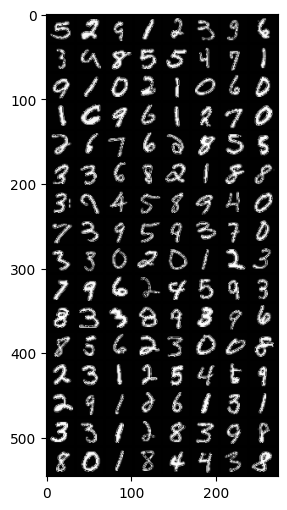

In [ ]:
plt.imshow(transforms.ToPILImage()(make_grid(real_batch)))

## 2. Model Architecture

We will follow the general architecture of a DCGAN - or deep convolutional GAN. This [influential paper](https://arxiv.org/pdf/1511.06434v2.pdf) produced much of the foundation for modern GANs and how to train them.

(GANs are notoriously **hard** to train, we will try to get a feeling why in this notebook.)


Complete the function `get_upscaling_block`. Then, use the function to define our model defined as follows:

Input: Random "noise" $z$ shaped `[n_batch, n_z]`

Output: Generated image size `[n_batch, 1, 32, 32]` in range [-1, 1]

1. Reshape z into `[n_batch, n_z, 1, 1]` to make it into an "image"
2. First upscaling block $\rightarrow$ `[n_batch, ngf*4, 4, 4]`
3. Second upscaling block $\rightarrow$ `[n_batch, ngf*2, 8, 8]`
4. Third upscaling block $\rightarrow$ `[n_batch, ngf, 16, 16]`
5. Fourth (and last) upscaling block $\rightarrow$ `[n_batch, 1, 32, 32]`

## 2.1. The Generator



The generator performs subsequent upsampling blocks, transforming a latent vector shaped [batch_size, latent_size] into an image (values in [-1, 1]).

The generator block will consists of:
- Transpose Convolution
- Batch Norm
- ReLU

In [ ]:
def get_upscaling_block(channels_in, channels_out, kernel, stride, padding, last_layer=False):
    '''
    Each transpose conv will be followed by BatchNorm and ReLU,
    except the last block (which is only followed by tanh)
    '''
    layers = []

    layers.append(nn.ConvTranspose2d(channels_in, channels_out, kernel, stride=stride, padding=padding, bias=False))

    if not last_layer:
        layers.extend([
            nn.BatchNorm2d(channels_out),
            nn.ReLU(inplace=True)
        ])
    else:
        layers.append(nn.Tanh())

    return nn.Sequential(*layers)




class Generator(nn.Module):
    def __init__(self, nz, ngf, nchannels=1):
        '''
        nz: The latent size (100 in our case)
        ngf: The channel-size before the last layer (32 our case)
        '''
        super().__init__()

        self.model = nn.Sequential(get_upscaling_block(nz, ngf*4, 4, 1, 0),
                                   get_upscaling_block(ngf*4, ngf*2, 4, 2, 1),
                                   get_upscaling_block(ngf*2, ngf, 4, 2, 1),
                                   get_upscaling_block(ngf, nchannels, 4, 2, 1, last_layer=True))

    def forward(self, z):
        x = z.unsqueeze(2).unsqueeze(2) # give spatial dimensions to z
        return self.model(x)


### 2.1.3. Sanity Tests

In [ ]:
nz = 1000
z = torch.randn(batch_size, nz)

In [ ]:
G = Generator(nz=nz, ngf=16)
assert G(z).shape == (batch_size, 1, 32, 32)

G = Generator(nz=nz, ngf=16)
assert G(z).shape == (batch_size, 1, 32, 32)

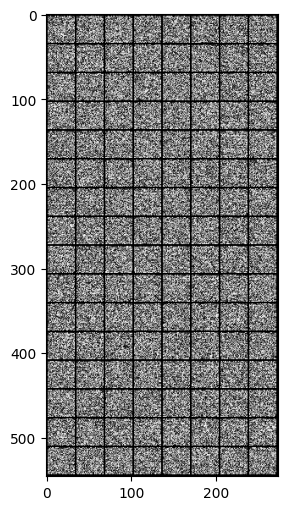

In [ ]:
# visualize the output - at first it should just look like random noise!!
x_fake = G(z)
plt.imshow(transforms.ToPILImage()(make_grid(x_fake, nrow=8)))

## 2.2. The discriminator

The discriminator will be a mirror image of the generator.

The discriminator will also use a fully convolutional architecutre, with each block consisting of:
- Conv layer
- BatchNorm
- ReLU

Complete the function `get_downscaling_block` and then use it to define the following architecture for the discriminator:

Input: Image shaped `[n_batch, 1, 32, 32]` (in [-1, 1])
Output: Discriminator scores `[n_batch, 1]` in range [0, 1]

1. First downscaling block $\rightarrow$ `[n_batch, ndf, 16, 16]`
2. Second downscaling block $\rightarrow$ `[n_batch, ndf*2, 8, 8]`
3. Third downscaling block $\rightarrow$ `[n_batch, ndf*4, 4, 4]`
4. Last downscaling block $\rightarrow$ `[n_batch, 1]`

In [ ]:
def get_downscaling_block(channels_in, channels_out, kernel, stride, padding, use_batch_norm=True, is_last=False):

    layers = []

    layers.append(nn.Conv2d(channels_in, channels_out, kernel, stride=stride, padding=padding, bias=False))

    if use_batch_norm and not is_last:
        layers.append(nn.BatchNorm2d(channels_out))

    if is_last:
        layers.append(nn.Sigmoid())
    else:
        layers.append(nn.LeakyReLU(negative_slope=0.2, inplace=True))

    return nn.Sequential(*layers)




class Discriminator(nn.Module):
    def __init__(self, ndf, nchannels=1):
        super().__init__()

        self.model = nn.Sequential(get_downscaling_block(nchannels, ndf, 4, 2, 1),
                                   get_downscaling_block(ndf, ndf*2, 4, 2, 1),
                                   get_downscaling_block(ndf*2, ndf*4, 4, 2, 1),
                                   get_downscaling_block(ndf*4, 1, 4, 1, 0, is_last=True))

    def forward(self, x):
        return self.model(x).squeeze(1).squeeze(1) # remove spatial dimensions

### 2.2.3 Sanity Checking

In [ ]:
real_batch, real_labels = next(iter(dataloader))

In [ ]:
D = Discriminator(ndf=32, nchannels=1)
assert D(real_batch).shape == (real_batch.shape[0], 1)

# 3. Training

## 3.1 Loss
The essential thing to remember is that the logistic and the non-saturating logistic GAN losses can be written exclusively using the [binary cross entropy loss](https://pytorch.org/docs/stable/generated/torch.nn.BCELoss.html). Our GAN loss will be defined ONLY using the following criterion:



In [ ]:
criterion = nn.BCELoss() # we will build off of this to make our final GAN loss!

## 3.2 Helper functions

We will need a few helper functions.
1. First, we need to continuously sample z from a Gaussian distribution.
2. Secondly, we need to make our "ground-truth" labels when using the BCE loss. This should output vectors of either 0s or 1s.

In [ ]:
def sample_z(batch_size, nz):
    return torch.randn(batch_size, nz, device=device)

# this is for the real ground-truth label
def get_labels_one(batch_size):
    r = torch.ones(batch_size, 1)
    return r.to(device)

# this is for the generated ground-truth label
def get_labels_zero(batch_size):
    r = torch.zeros(batch_size, 1)
    return r.to(device)


# To initialize the weights of a GAN, the DCGAN paper found that best results are obtained
# with Gaussian initialization with mean=0; std=0.02
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


# for visualization
to_pil = transforms.ToPILImage()
renorm = transforms.Normalize((-1.), (2.))

## 3.3 Creating the optimizers and hyperparameters

The original DCGAN paper shows that Adam works well in the generator and the discriminator with a learning rate of 0.0002 and Beta1 = 0.5.



## 3.3 Training!

Now for the fun part, training!
Training a GAN consists in making an update to the discriminator, then the generator.
Training a GAN requires BABYSITTING!! Remember that many things can go wrong when training a GAN:
- The discriminator is too strong for the generator - the generator cannot improve.
- The generator easily fools the discriminator - cannot learn.
- Mode collapse - generator is not capable of generating diverse images.

In [ ]:
def train(nb_epochs = 5,
          nz = 100,
          ngf = 32,
          ndf = 32,
          nchannels= 1,
          lr_d = 0.0002,
          lr_g = 0.0005,
          beta1= 0.5,
          display_freq = 200):

  netD = Discriminator(ndf, nchannels).to(device)
  netG = Generator(nz, ngf).to(device)

  netD.apply(weights_init)
  netG.apply(weights_init)

  g_opt = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))
  d_opt = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))

  g_losses = []
  d_losses = []

  j = 0


  z_test = sample_z(64, nz) # we generate the noise only once for testing

  for epoch in range(nb_epochs):

      # train
      pbar = tqdm(enumerate(dataloader))
      for i, batch in pbar:
          im, _ = batch # we don't care about the label for unconditional generation
          im = im.to(device)

          cur_batch_size = im.shape[0]


          # 1. sample a z vector
          z = sample_z(cur_batch_size, nz)

          # 2. Generate a fake image
          fake_im = netG(z)

          # 3. Classify real image with D
          yhat_real = netD(im)
          labels_real = get_labels_one(cur_batch_size)
          d_loss_real = criterion(yhat_real, labels_real)

          # 4. Classify fake image with D
          yhat_fake = netD(fake_im.detach())  # detach() to avoid backpropagating through the generator
          labels_fake = get_labels_zero(cur_batch_size)
          d_loss_fake = criterion(yhat_fake, labels_fake)


          ###
          ### Discriminator
          ###

          d_loss = d_loss_real + d_loss_fake
          d_opt.zero_grad()
          d_loss.backward(retain_graph=True) # we need to retain graph=True to be able to calculate the gradient in the g backprop
          d_opt.step()


          ###
          ### Generator
          ###

          # Classify fake image with updated D
          yhat_fake_after_update = netD(fake_im)
          labels_fake_after_update = get_labels_one(cur_batch_size)

          g_loss = criterion(yhat_fake_after_update, labels_fake_after_update)
          g_opt.zero_grad()
          g_loss.backward()
          g_opt.step()


          # Save Metrics

          d_losses.append(d_loss.item())
          g_losses.append(g_loss.item())

          avg_real_score = yhat_real.mean().item()
          avg_fake_score = yhat_fake.mean().item()



          pbar.set_description(f"it: {j}; g_loss: {g_loss}; d_loss: {d_loss}; avg_real_score: {avg_real_score}; avg_fake_score: {avg_fake_score}")
          if i % display_freq == 0:

              fake_im = netG(z_test)

              un_norm = renorm(fake_im) # for visualization

              grid = torchvision.utils.make_grid(un_norm, nrow=8)
              pil_grid = to_pil(grid)

              print("generated images")
              plt.imshow(pil_grid)
              plt.show()

              plt.plot(range(len(g_losses)), g_losses, label='g loss')
              plt.plot(range(len(g_losses)), d_losses, label='d loss')

              plt.legend()
              plt.show()

          j += 1

it: 0; g_loss: 0.9861584901809692; d_loss: 1.7842689752578735; avg_real_score: 0.3215320408344269; avg_fake_score: 0.4314981698989868: : 0it [00:00, ?it/s]

generated images


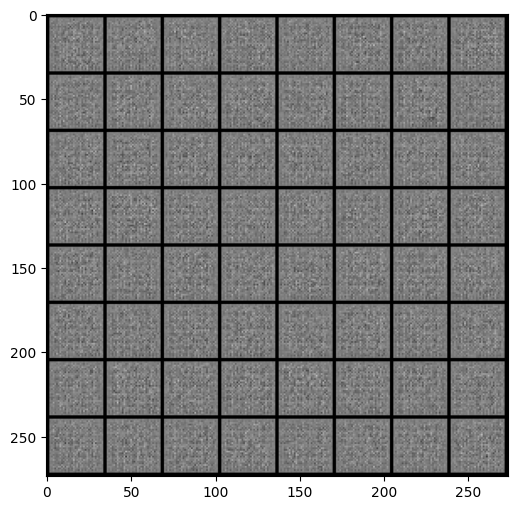

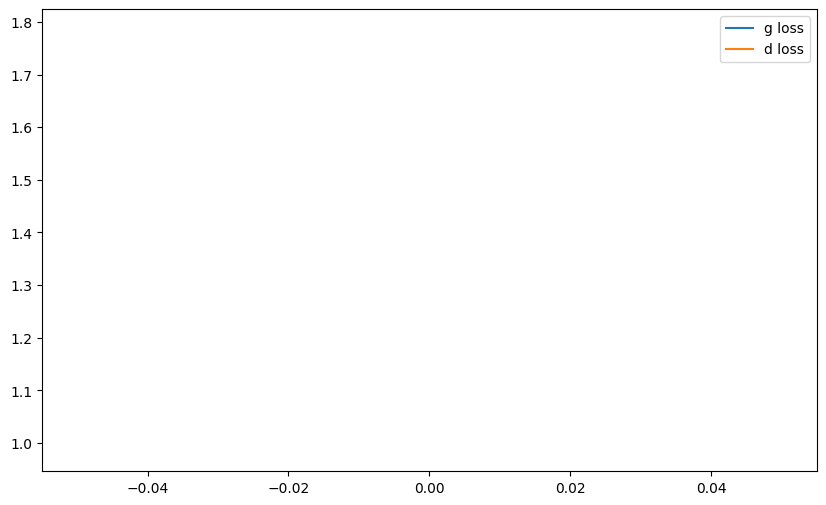

it: 200; g_loss: 0.8578677773475647; d_loss: 0.9615313410758972; avg_real_score: 0.4856618642807007; avg_fake_score: 0.12345080077648163: : 199it [00:15, 11.84it/s]

generated images


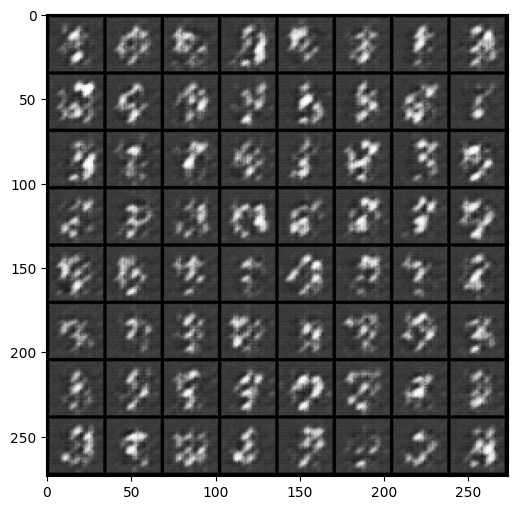

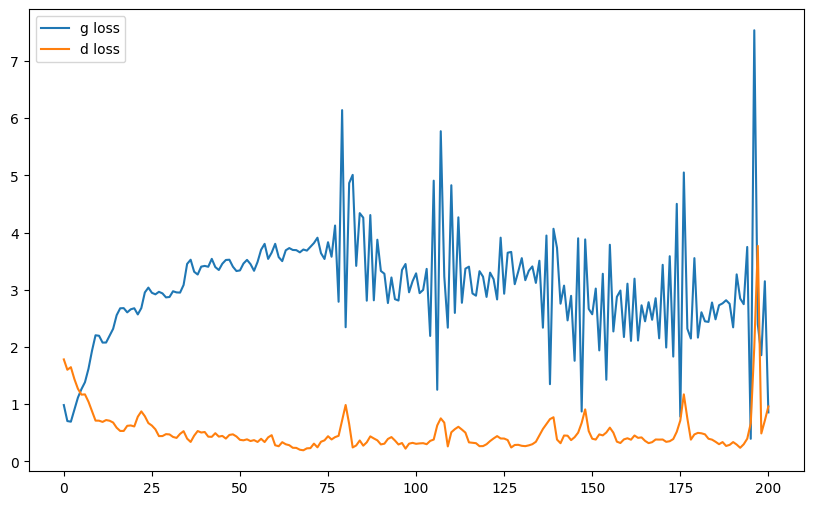

it: 400; g_loss: 3.2347874641418457; d_loss: 0.16031652688980103; avg_real_score: 0.9340502023696899; avg_fake_score: 0.08499433100223541: : 400it [00:31, 14.01it/s]

generated images


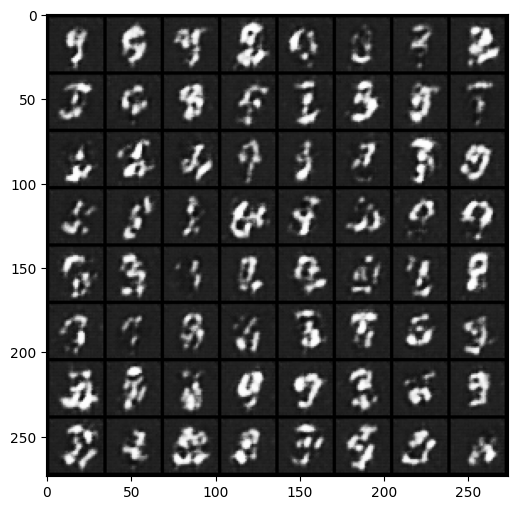

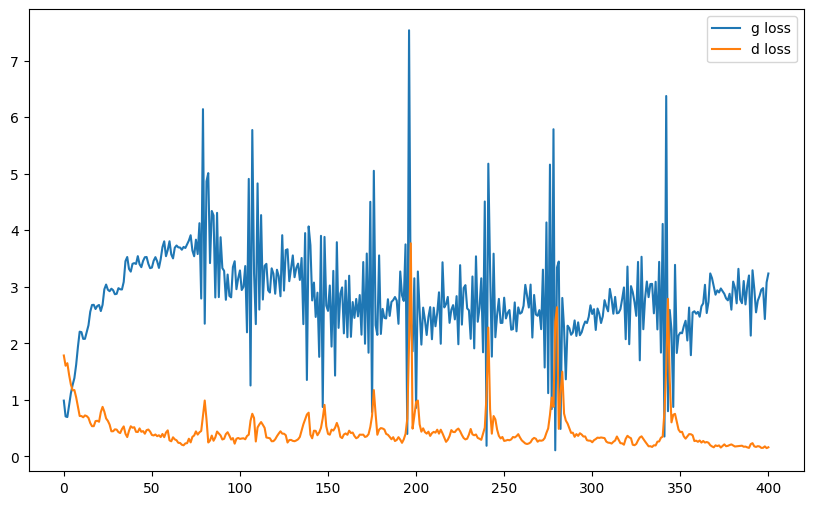

it: 468; g_loss: 3.4976413249969482; d_loss: 0.7570280432701111; avg_real_score: 0.9137049913406372; avg_fake_score: 0.46055370569229126: : 469it [00:36, 12.87it/s]
it: 469; g_loss: 1.960932731628418; d_loss: 0.5605612993240356; avg_real_score: 0.6396147608757019; avg_fake_score: 0.06888764351606369: : 0it [00:00, ?it/s]

generated images


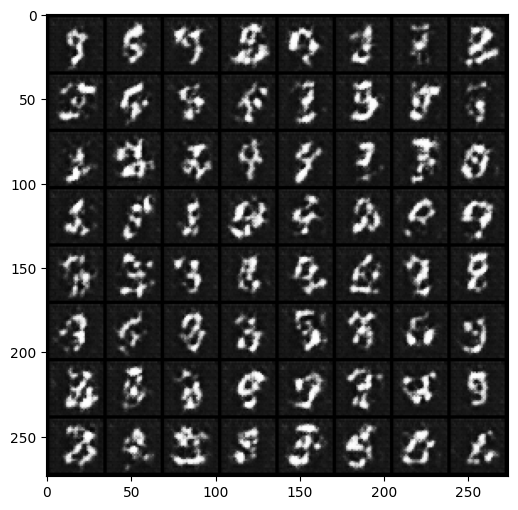

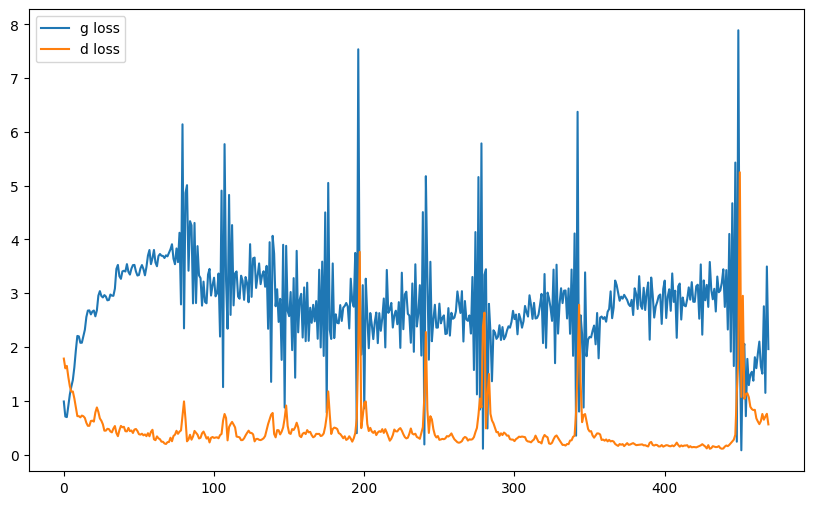

it: 669; g_loss: 1.7382749319076538; d_loss: 0.4980930984020233; avg_real_score: 0.6911822557449341; avg_fake_score: 0.09520947188138962: : 199it [00:16, 13.28it/s]

generated images


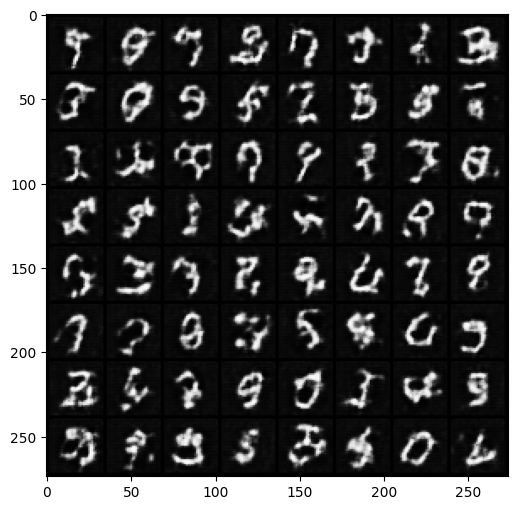

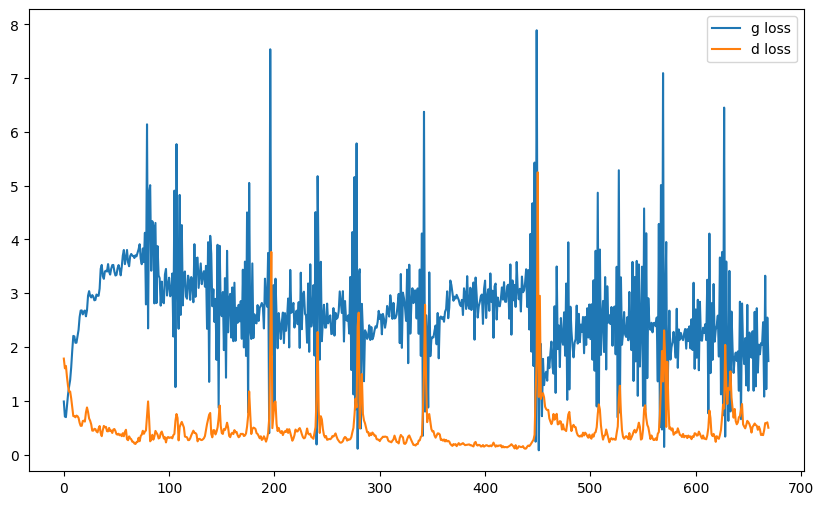

it: 869; g_loss: 3.1101560592651367; d_loss: 0.561995267868042; avg_real_score: 0.7854436039924622; avg_fake_score: 0.25537213683128357: : 399it [00:33, 10.86it/s]

generated images


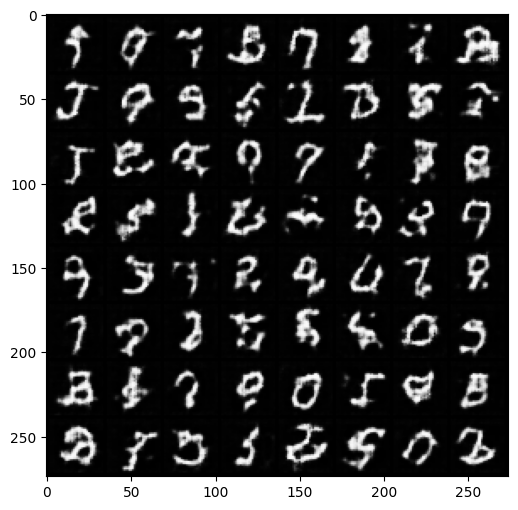

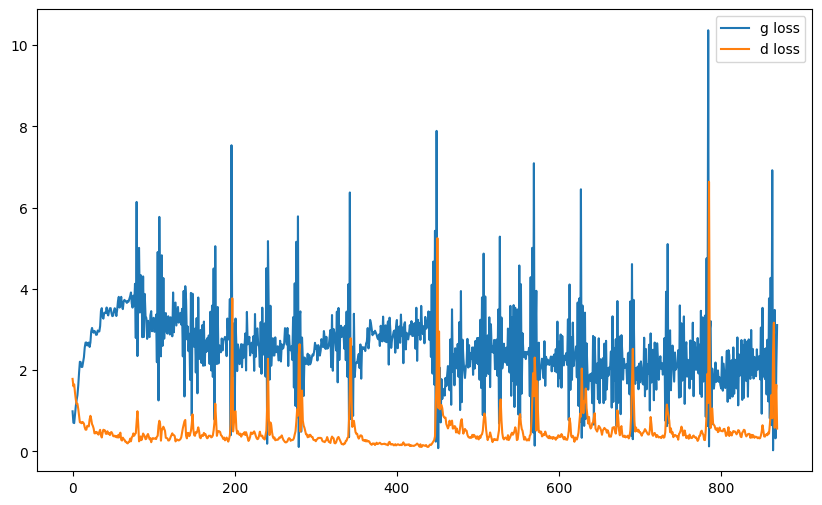

it: 937; g_loss: 1.5836681127548218; d_loss: 0.3785439133644104; avg_real_score: 0.7349457740783691; avg_fake_score: 0.050810556858778: : 469it [00:39, 11.83it/s]
it: 938; g_loss: 3.2688608169555664; d_loss: 0.4712624251842499; avg_real_score: 0.9498128890991211; avg_fake_score: 0.32426345348358154: : 0it [00:00, ?it/s]

generated images


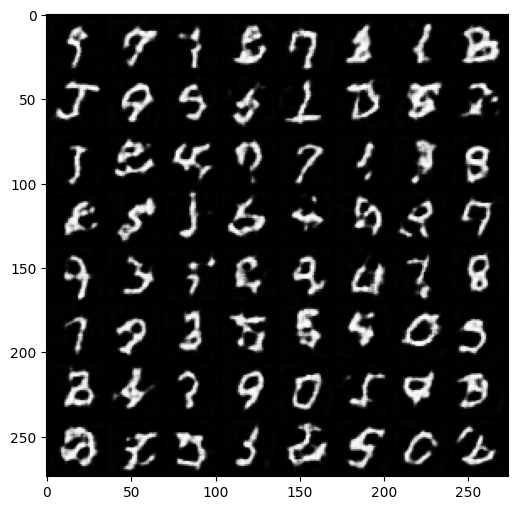

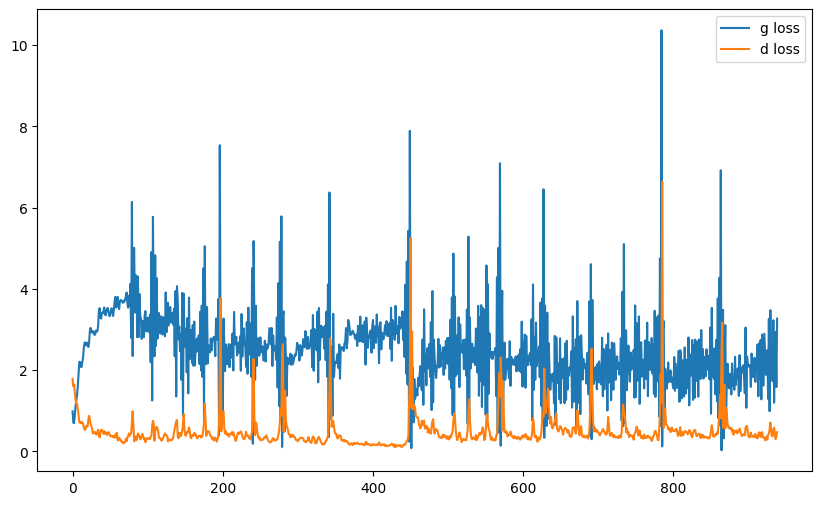

it: 1138; g_loss: 1.4092075824737549; d_loss: 0.46853578090667725; avg_real_score: 0.7525671720504761; avg_fake_score: 0.15066546201705933: : 199it [00:16, 13.34it/s]

generated images


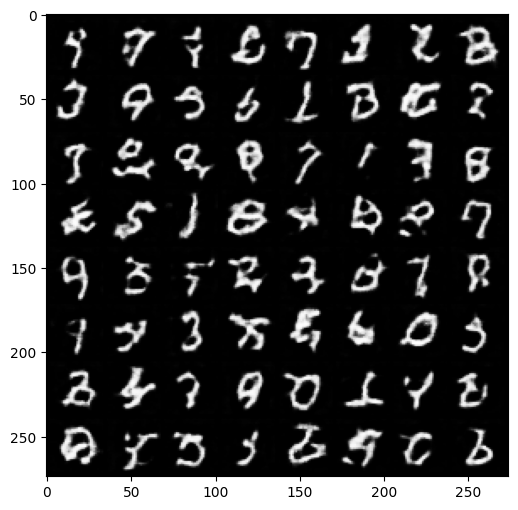

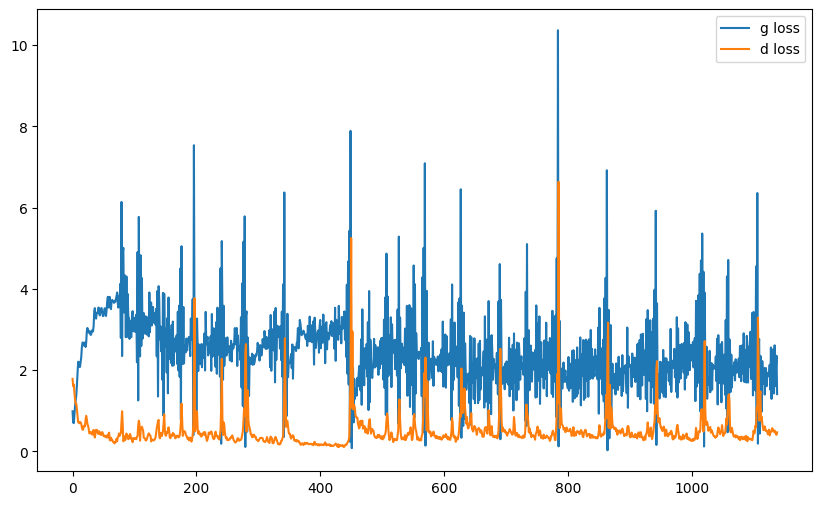

it: 1338; g_loss: 3.8800208568573; d_loss: 0.5078632235527039; avg_real_score: 0.9508383274078369; avg_fake_score: 0.3462546467781067: : 400it [00:34, 13.00it/s]   

generated images


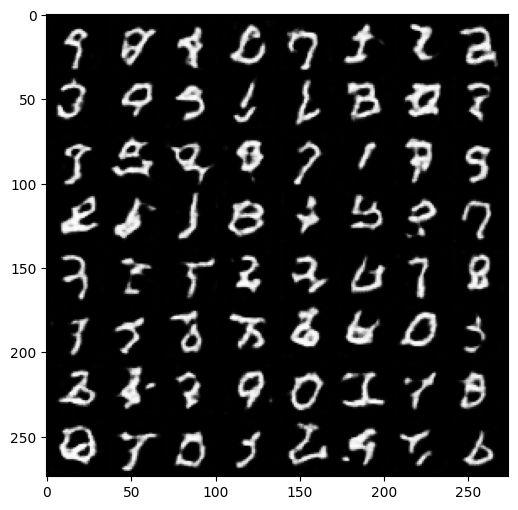

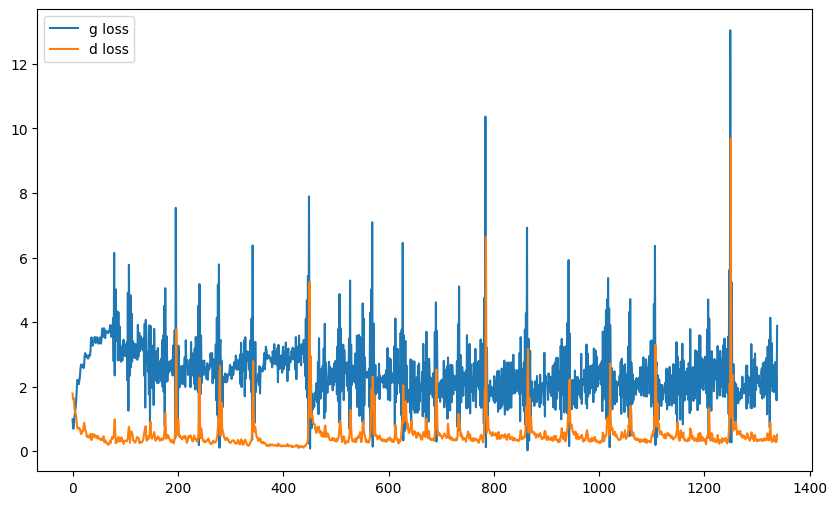

it: 1406; g_loss: 2.585747241973877; d_loss: 0.2758561968803406; avg_real_score: 0.8406252264976501; avg_fake_score: 0.08709180355072021: : 469it [00:41, 11.40it/s]
it: 1407; g_loss: 1.9181768894195557; d_loss: 0.3472926616668701; avg_real_score: 0.8211605548858643; avg_fake_score: 0.12318108230829239: : 0it [00:00, ?it/s]

generated images


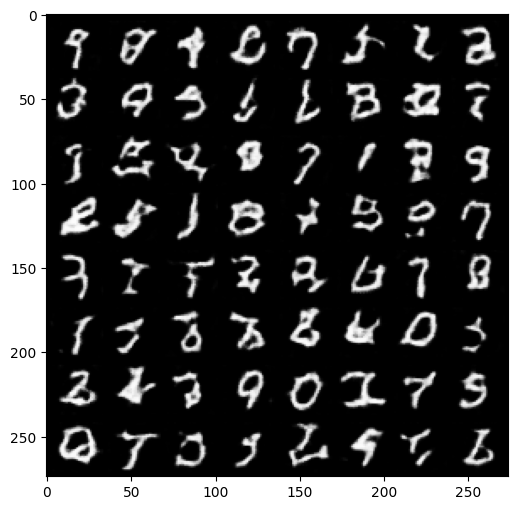

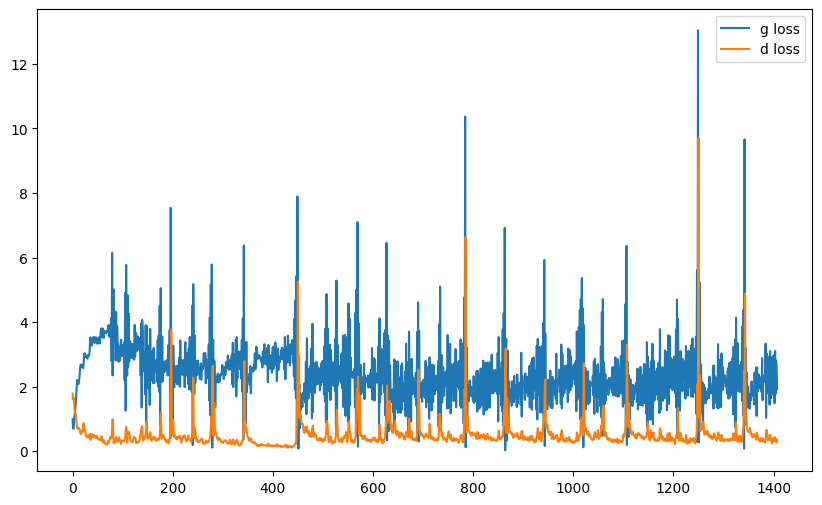

it: 1607; g_loss: 2.2269959449768066; d_loss: 0.34620070457458496; avg_real_score: 0.8400600552558899; avg_fake_score: 0.14411935210227966: : 199it [00:17, 12.61it/s]

generated images


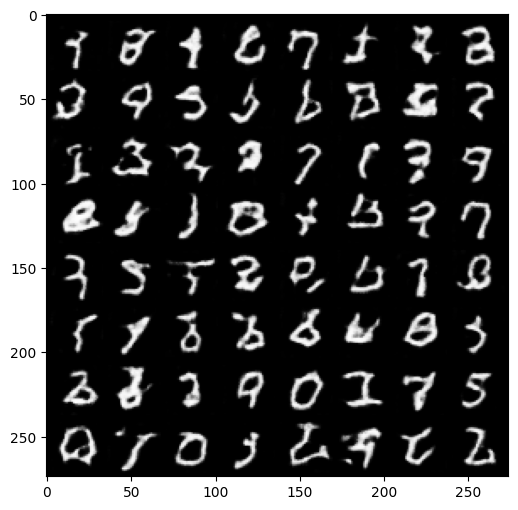

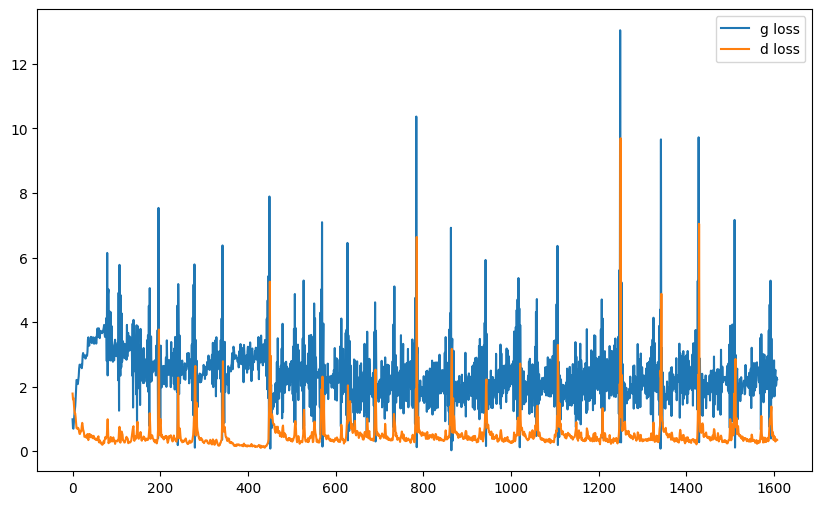

it: 1807; g_loss: 0.8517310619354248; d_loss: 0.521953821182251; avg_real_score: 0.6463272571563721; avg_fake_score: 0.03819967806339264: : 399it [00:35, 12.52it/s]

generated images


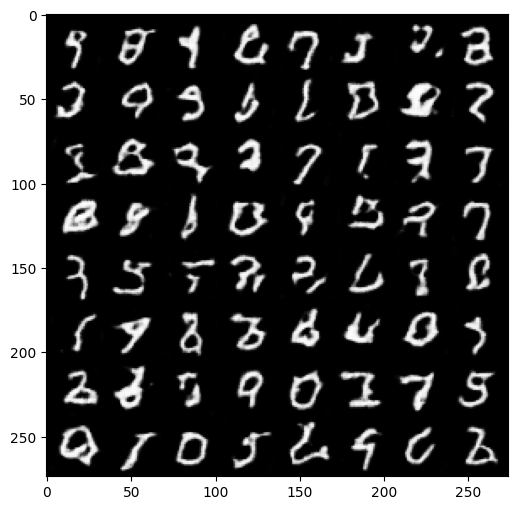

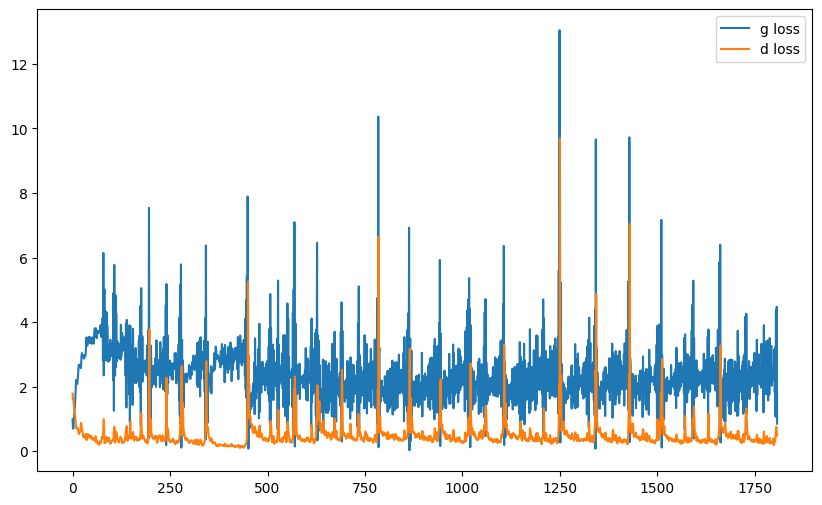

it: 1875; g_loss: 2.0731418132781982; d_loss: 0.9323568344116211; avg_real_score: 0.7174784541130066; avg_fake_score: 0.39011406898498535: : 469it [00:41, 11.32it/s]
it: 1876; g_loss: 0.5028634071350098; d_loss: 1.2689039707183838; avg_real_score: 0.3950703740119934; avg_fake_score: 0.21738165616989136: : 0it [00:00, ?it/s]

generated images


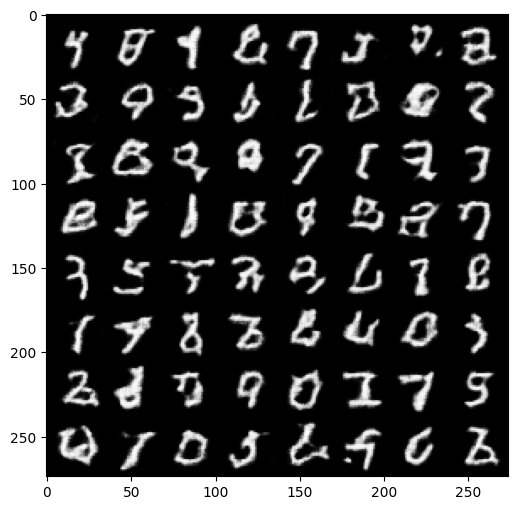

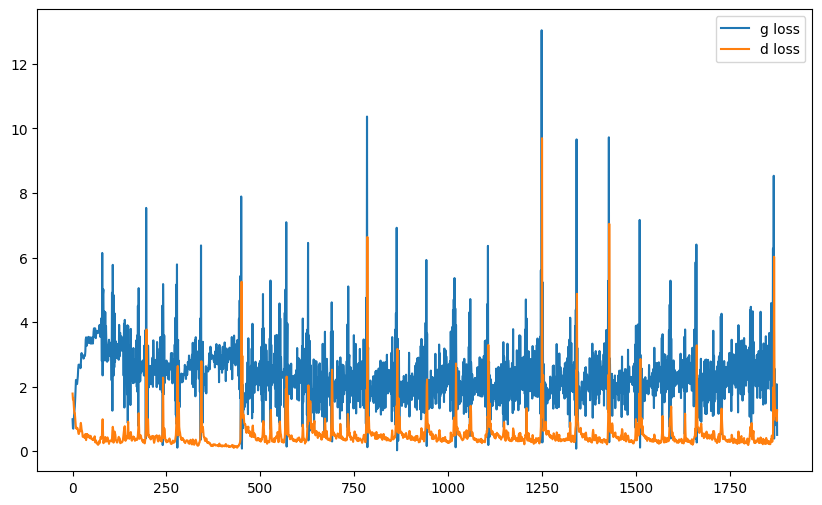

it: 2076; g_loss: 2.2079501152038574; d_loss: 0.281416118144989; avg_real_score: 0.882115364074707; avg_fake_score: 0.1332309991121292: : 200it [00:18, 10.90it/s]   

generated images


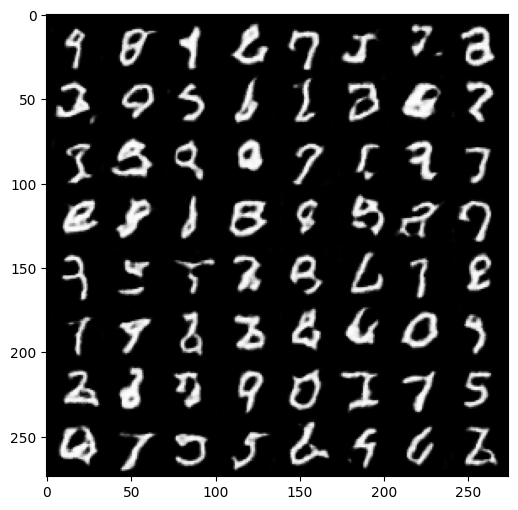

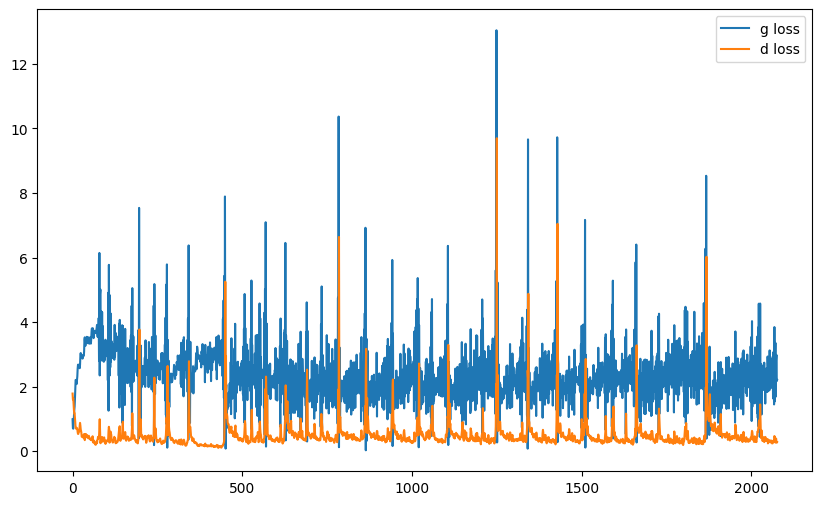

it: 2276; g_loss: 3.1264214515686035; d_loss: 0.2628709673881531; avg_real_score: 0.9046586751937866; avg_fake_score: 0.1416662335395813: : 400it [00:35, 12.39it/s]  

generated images


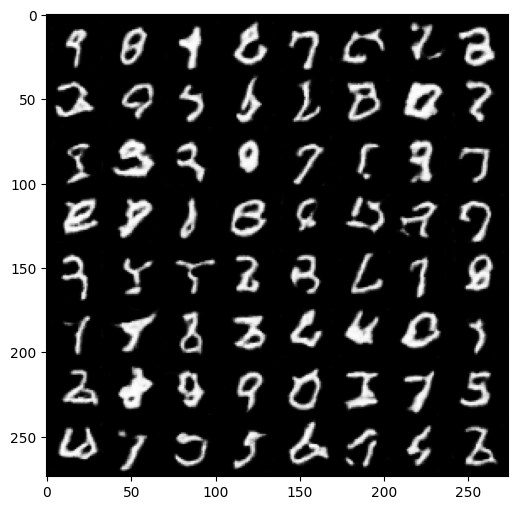

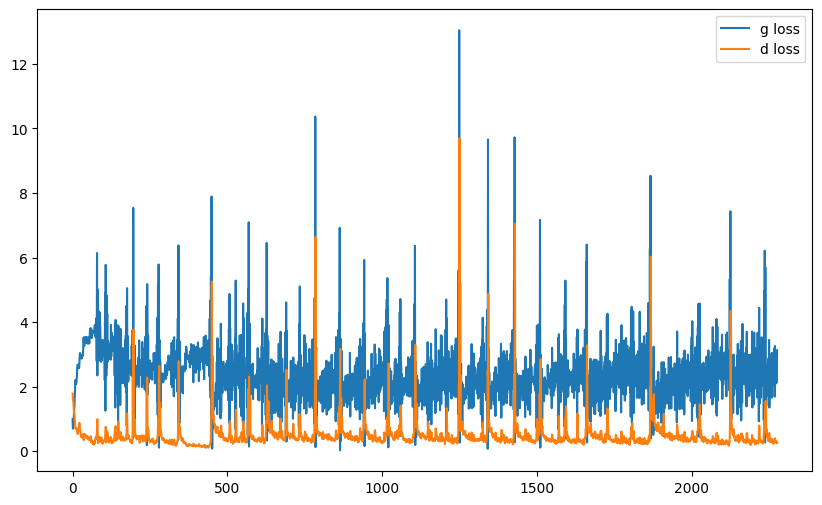

it: 2344; g_loss: 3.002181053161621; d_loss: 0.20773489773273468; avg_real_score: 0.8828959465026855; avg_fake_score: 0.07183750718832016: : 469it [00:42, 11.13it/s]


In [ ]:
train(nz=1000)

# 4. Conditional GANs [BONUS]

A simple way to improve training performance and obtain control of the generation is to provide extra information into the Generator and the Discriminator, known as **Conditional GANs**. In this case, we will provide the class label (digit number of MNIST) into both the generator and the discriminator. This will help both of the networks.

## 4.1 Conditional Generator and Discriminator

Complete the ConditionalDiscriminator and ConditionalGenerator classes using your GAN building blocks (`get_upsampling_block` and `get_downsampling_block` functions).


### 4.1.1 Generator

In [ ]:
# GENERATOR

'''
The conditional generator needs the label information as well as the latent vector. We will combine the latent vector and the class information in the following way:

- The class information for the generator will be represented as a one-hot vector sized `[batch_size, 10]` (since there are 10 classes in MNIST)
- The latent vector for the generator will still be sized `[batch_size, nz]`

1. Transform both of these modalities into 'images' (by adding dimensions)
2. Like before, apply the first upscaling block to both of these 'images'. We will now have 2 separate blocks sized

'''

class ConditionalGenerator(nn.Module):
    def __init__(self, nz, nc, ngf, nchannels=1):
        super().__init__()

        self.upscaling_z = get_upscaling_block(nz, ngf*8, 4, 1, 0)
        self.upscaling_c = get_upscaling_block(nc, ngf*8, 4, 1, 0)

        self.rest_model = nn.Sequential(get_upscaling_block(ngf*16, ngf*8, 4, 2, 1),
                                        get_upscaling_block(ngf*8, ngf*4, 4, 2, 1),
                                        get_upscaling_block(ngf*4, 1, 4, 2, 1, last_layer=True))

    def forward(self, x, y):
        x = x.unsqueeze(2).unsqueeze(2)
        y = y.unsqueeze(2).unsqueeze(2)

        # Upscale both z and y
        z = self.upscaling_z(x)
        y = self.upscaling_c(y)

        # Concatenate the two branches along the channel dimension
        x = torch.cat((z, y), dim=1)

        return self.rest_model(x)

### 4.1.2 Discriminator

In [ ]:
# Discriminator

'''
The conditional discriminator needs the label information as well as the latent vector. We will combine the latent vector and the class information in the following way:

- The class information for the discriminator will be represented as a one-hot vector sized `[batch_size, 10]` (since there are 10 classes in MNIST)
- The latent vector for the generator will still be sized `[batch_size, nz]`

1. Transform both of these modalities into 'images' (by adding dimensions)
2. Like before, apply the first upscaling block to both of these 'images'. We will now have 2 separate blocks sized

'''

class ConditionalDiscriminator(nn.Module):
    def __init__(self, ndf, nc, nchannels=1):
        super().__init__()
        self.downscale_x = get_downscaling_block(nchannels, ndf*2, 4, 2, 1, use_batch_norm=False)
        self.downscale_y = get_downscaling_block(nc, ndf*2, 4, 2, 1, use_batch_norm=False)

        self.rest = nn.Sequential(get_downscaling_block(ndf*4, ndf*8, 4, 2, 1),
                                  get_downscaling_block(ndf*8, ndf*16, 4, 2, 1),
                                  get_downscaling_block(ndf*16, 1, 4, 1, 0, is_last=True))

    def forward(self, x, y):
        x = self.downscale_x(x)

        # Expansion of y
        y = y.unsqueeze(2).unsqueeze(3).expand(-1, -1, 32, 32)

        # y downscale
        y = self.downscale_y(y)

        x = torch.cat((x,y), dim=1)

        return self.rest(x).squeeze(1).squeeze(1) # remove spatial dimensions

### 4.1.3 Sanity Checks

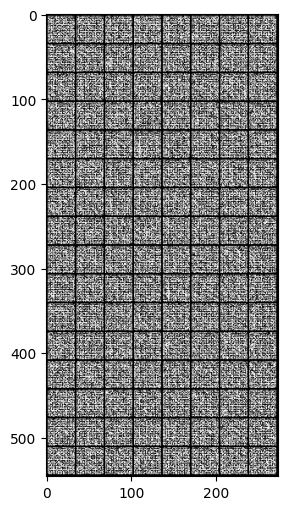

In [ ]:
# CONDITIONAL GENERATOR SANITY CHECKING

z = torch.randn(batch_size, nz)
y = F.one_hot(real_labels).float()

cG = ConditionalGenerator(nz=nz, ngf=16, nc=10)
x_fake = cG(z, y)
plt.imshow(transforms.ToPILImage()(make_grid(x_fake, nrow=8)))

In [ ]:
# Conditional Discriminator Sanity Checking

cD = ConditionalDiscriminator(ndf=32, nc=10, nchannels=1)
assert cD(real_batch, F.one_hot(real_labels).float()).shape == (real_batch.shape[0], 1)

## 4.2 Training

In [ ]:
nz = 100
ndf = 32
ngf = 32
nchannels= 1
lr_d = 0.0002
lr_g = 0.0005
beta1= 0.5
display_freq = 200

nc= 10

netD = ConditionalDiscriminator(ndf, nc, nchannels=1).to(device)
netG = ConditionalGenerator(nz, nc, ngf).to(device)

netG.apply(weights_init)
netD.apply(weights_init)

g_opt = torch.optim.Adam(netG.parameters(), lr=lr_g, betas=(beta1, 0.999))
d_opt = torch.optim.Adam(netD.parameters(), lr=lr_d, betas=(beta1, 0.999))



it: 0; g_loss: 1.4746034145355225; d_loss: 2.323352098464966; avg_real_score: 0.3283679485321045; avg_fake_score: 0.5313780307769775: : 0it [00:00, ?it/s]

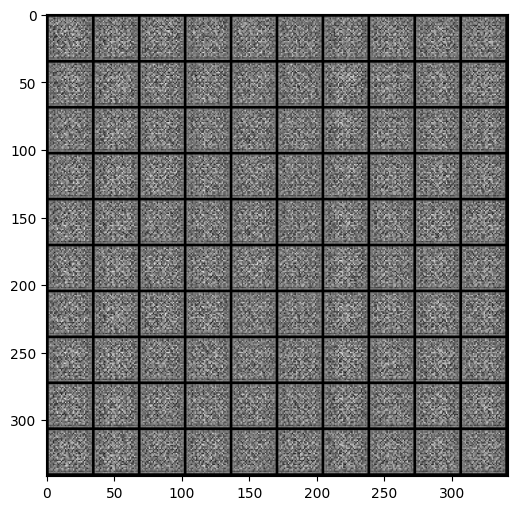

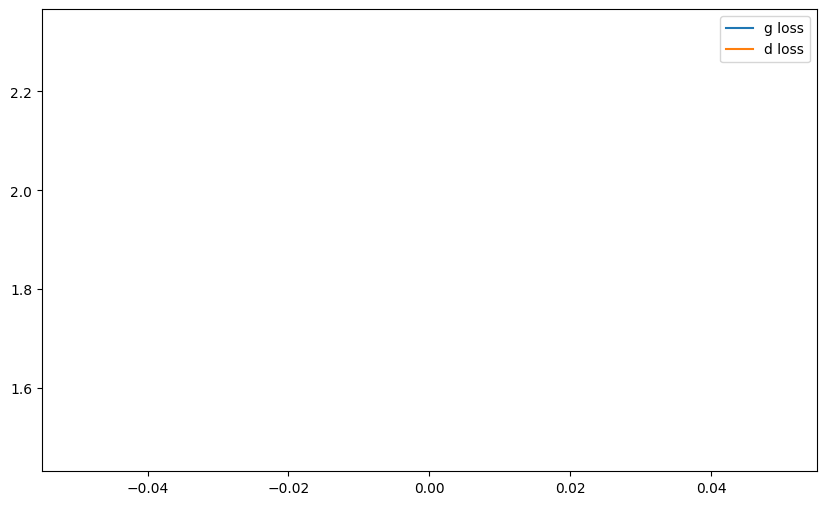

it: 200; g_loss: 1.572289228439331; d_loss: 0.9888483285903931; avg_real_score: 0.6028467416763306; avg_fake_score: 0.31559598445892334: : 200it [00:27,  8.13it/s]

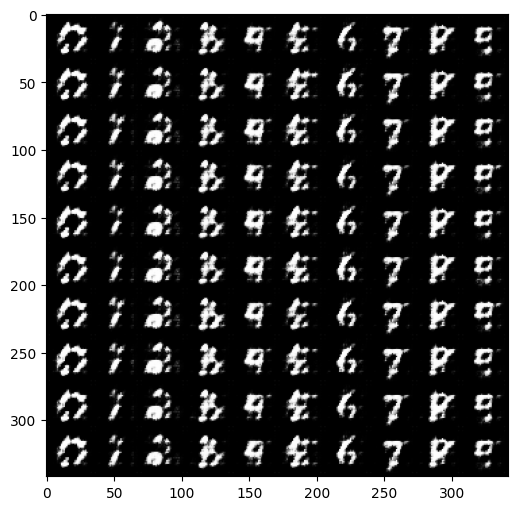

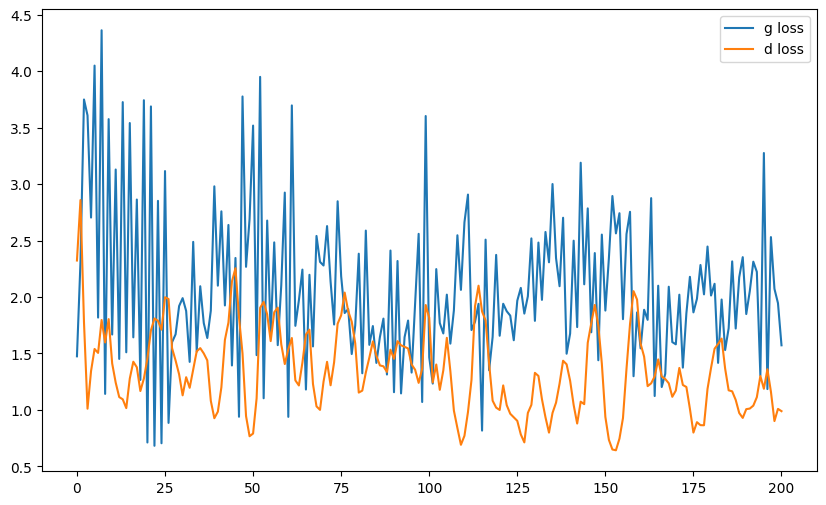

it: 400; g_loss: 2.076019763946533; d_loss: 0.961361289024353; avg_real_score: 0.8005228042602539; avg_fake_score: 0.4485896825790405: : 400it [00:54,  7.80it/s]   

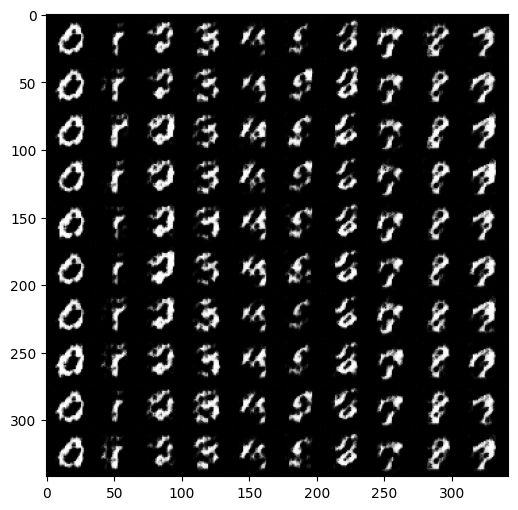

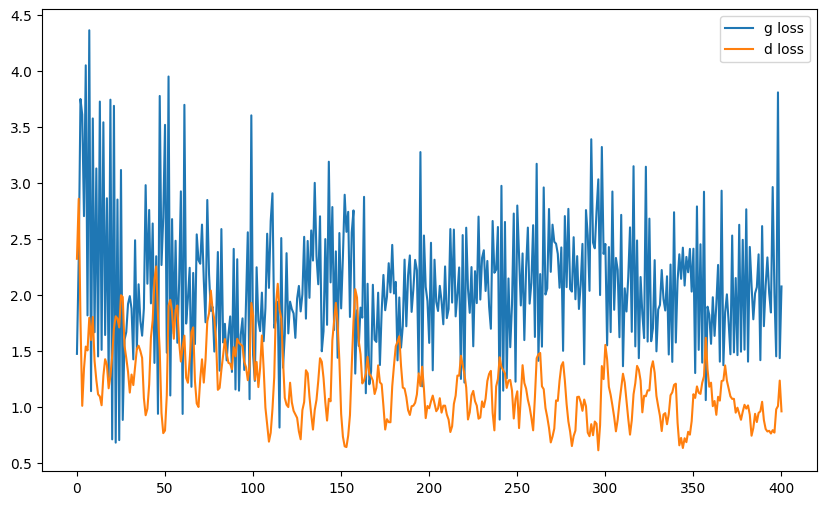

it: 468; g_loss: 3.040971279144287; d_loss: 1.015463948249817; avg_real_score: 0.7977185249328613; avg_fake_score: 0.46996068954467773: : 469it [01:04,  7.30it/s]
it: 469; g_loss: 0.8402809500694275; d_loss: 1.1883163452148438; avg_real_score: 0.4487171173095703; avg_fake_score: 0.13350588083267212: : 0it [00:00, ?it/s]

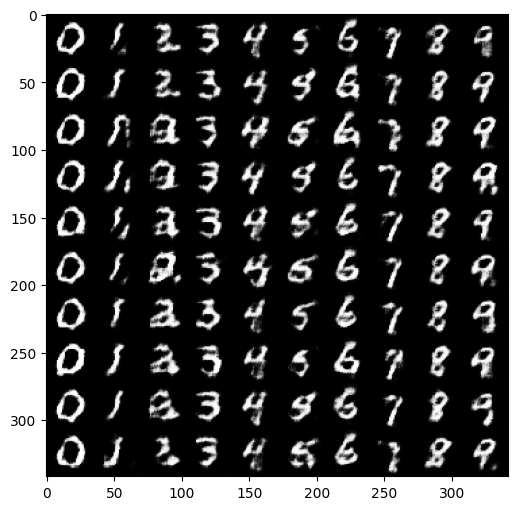

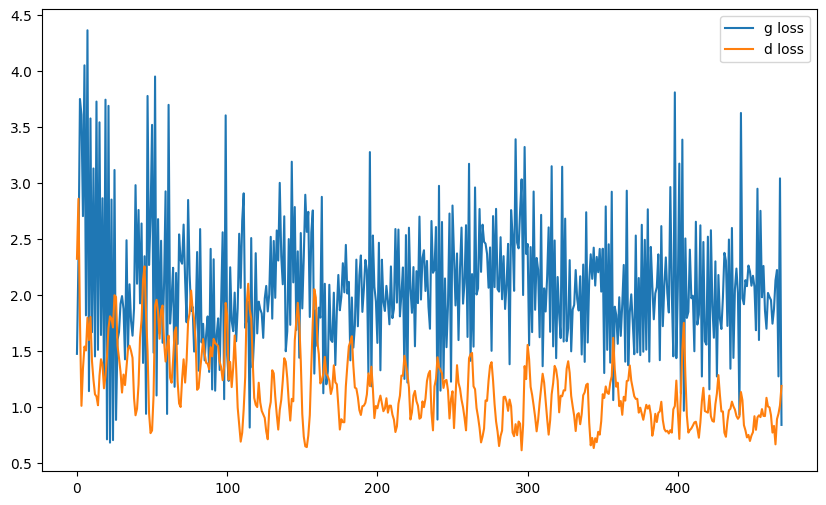

it: 669; g_loss: 1.508320927619934; d_loss: 1.097153663635254; avg_real_score: 0.6032149791717529; avg_fake_score: 0.3750835061073303: : 200it [00:27,  7.77it/s]  

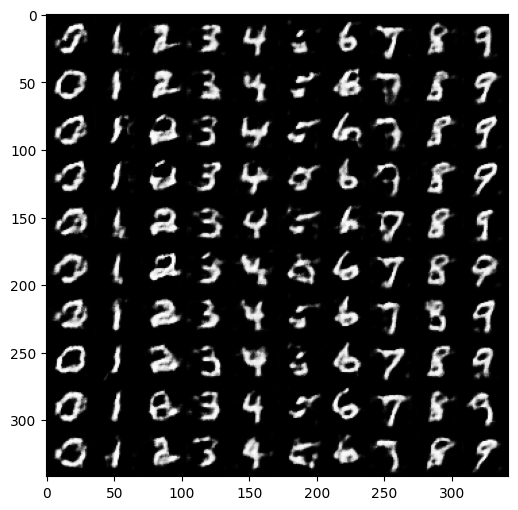

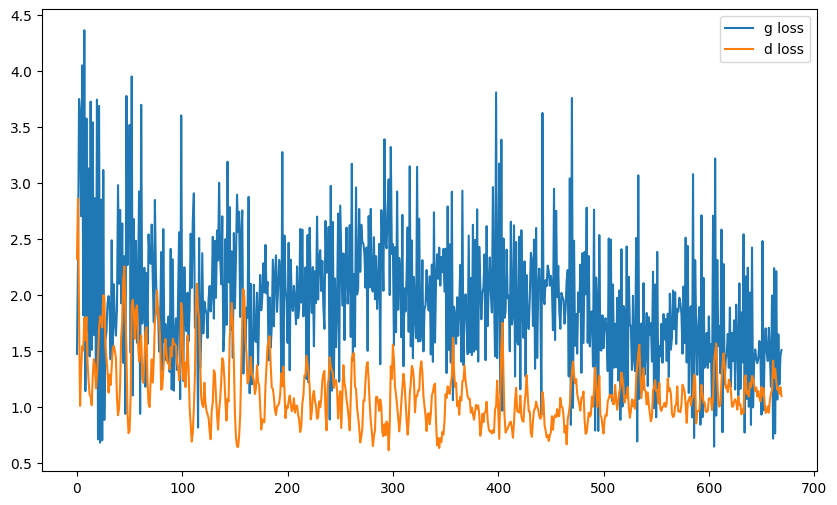

it: 869; g_loss: 1.993701696395874; d_loss: 1.4206222295761108; avg_real_score: 0.7170087099075317; avg_fake_score: 0.6237097382545471: : 400it [00:58,  6.00it/s] 

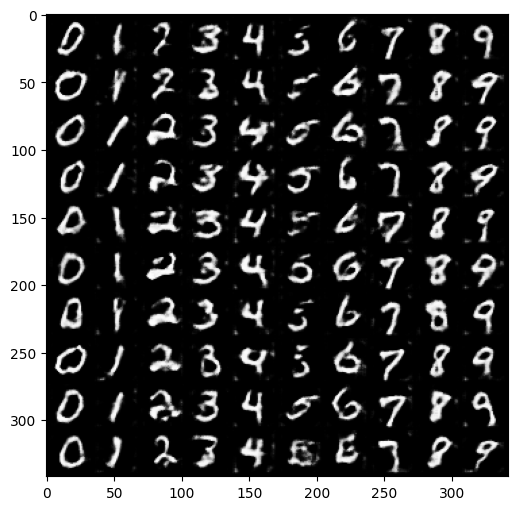

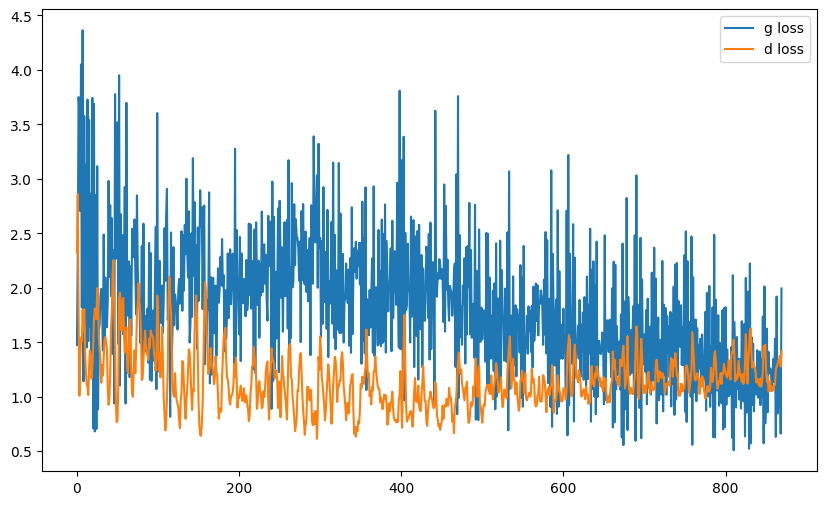

it: 937; g_loss: 0.94395512342453; d_loss: 1.1767538785934448; avg_real_score: 0.47364991903305054; avg_fake_score: 0.28726911544799805: : 469it [01:08,  6.88it/s]
it: 938; g_loss: 1.048647403717041; d_loss: 1.1648098230361938; avg_real_score: 0.6227433681488037; avg_fake_score: 0.4603879749774933: : 0it [00:00, ?it/s]

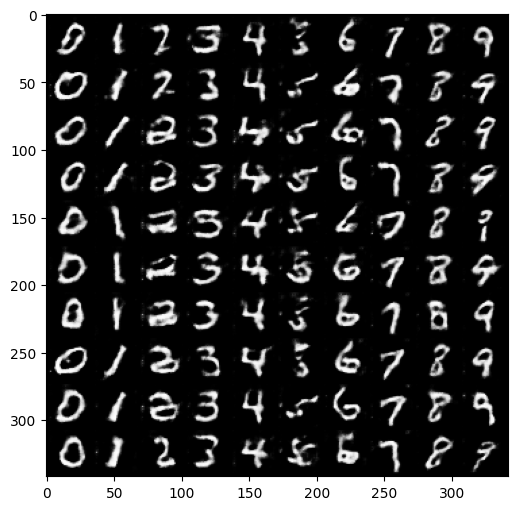

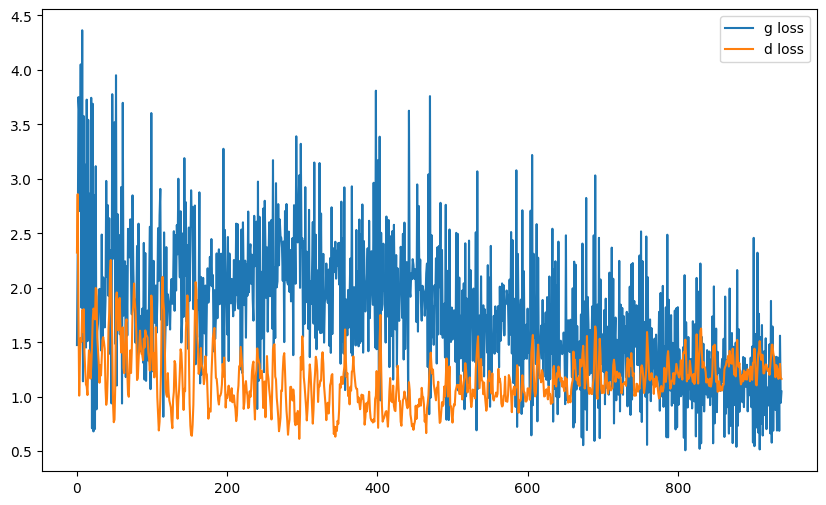

it: 1138; g_loss: 0.9954066276550293; d_loss: 1.2181144952774048; avg_real_score: 0.48976412415504456; avg_fake_score: 0.34395545721054077: : 200it [00:27,  7.44it/s]

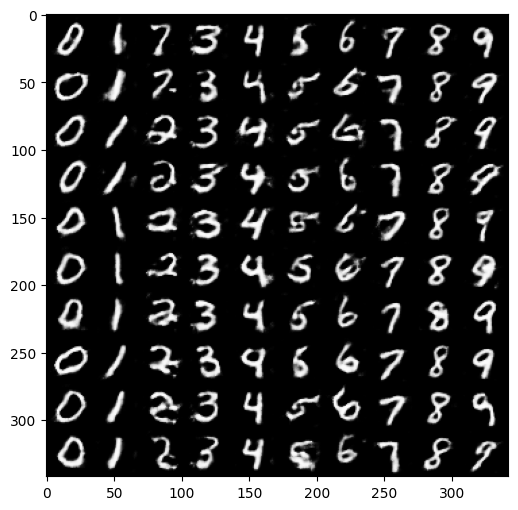

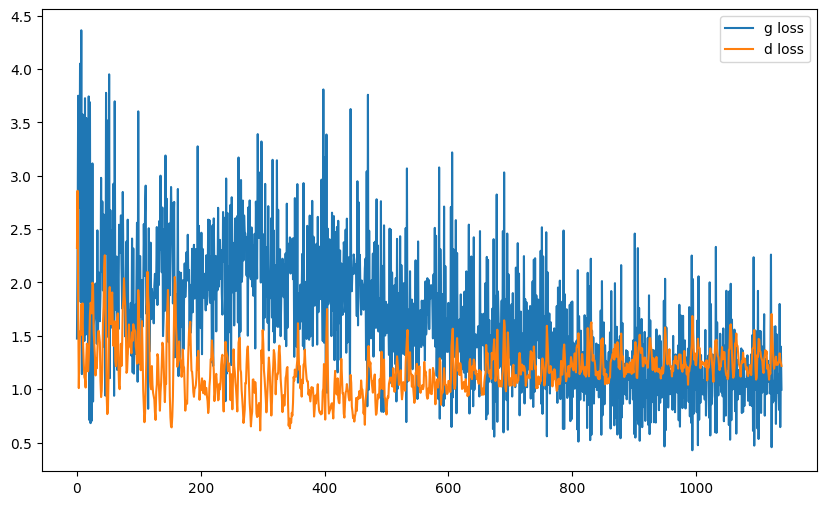

it: 1338; g_loss: 1.328285574913025; d_loss: 1.3720576763153076; avg_real_score: 0.6852813363075256; avg_fake_score: 0.603668212890625: : 400it [00:55,  6.52it/s]  

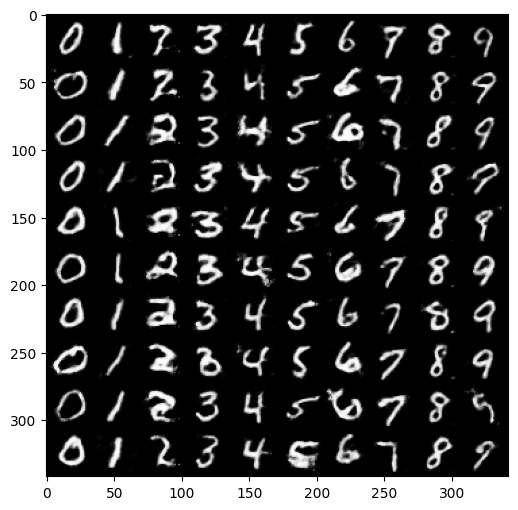

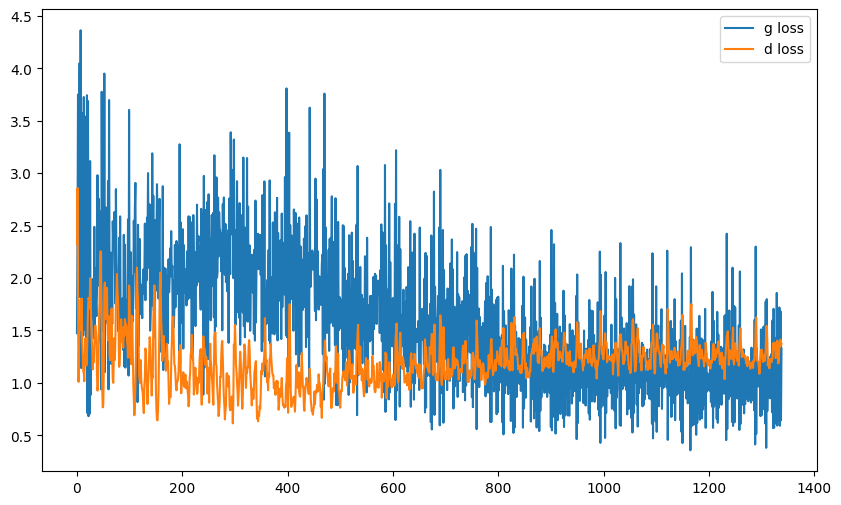

it: 1406; g_loss: 2.346388816833496; d_loss: 1.567199468612671; avg_real_score: 0.7875804901123047; avg_fake_score: 0.7039480209350586: : 469it [01:05,  7.20it/s]
it: 1407; g_loss: 0.441672146320343; d_loss: 1.7420872449874878; avg_real_score: 0.25589117407798767; avg_fake_score: 0.21600235998630524: : 0it [00:00, ?it/s]

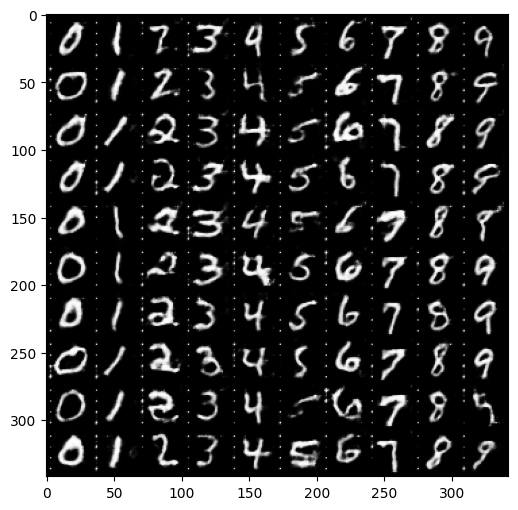

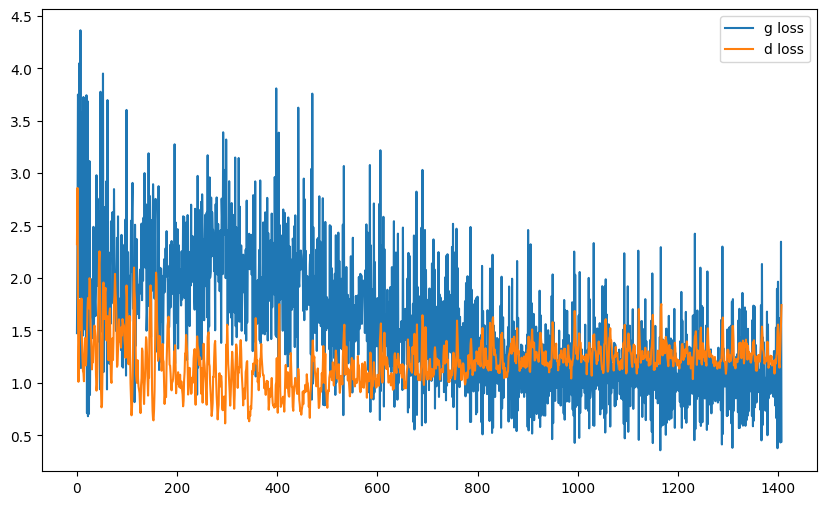

it: 1607; g_loss: 1.798458456993103; d_loss: 1.5707528591156006; avg_real_score: 0.7740761041641235; avg_fake_score: 0.697924017906189: : 200it [00:28,  7.54it/s]     

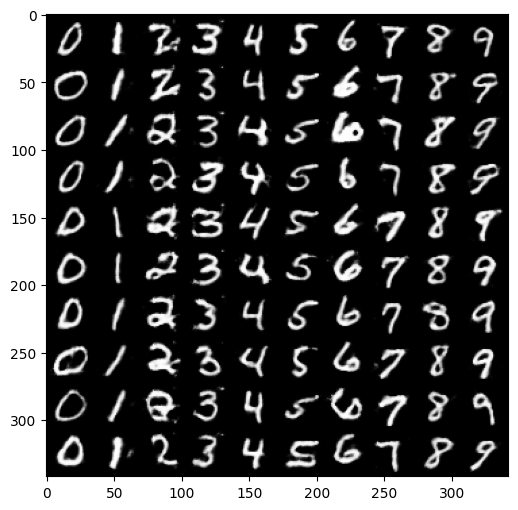

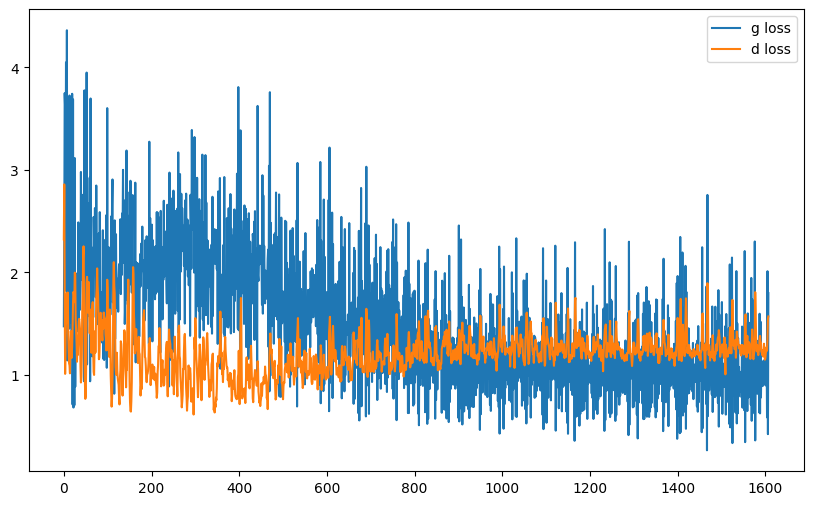

it: 1807; g_loss: 1.2332191467285156; d_loss: 1.201288104057312; avg_real_score: 0.6274684071540833; avg_fake_score: 0.48992815613746643: : 400it [00:56,  7.59it/s]

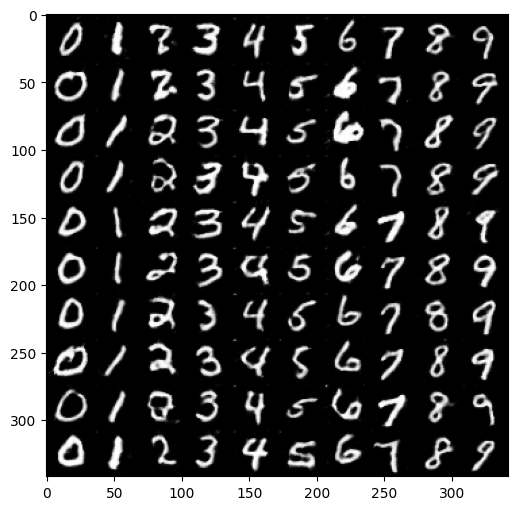

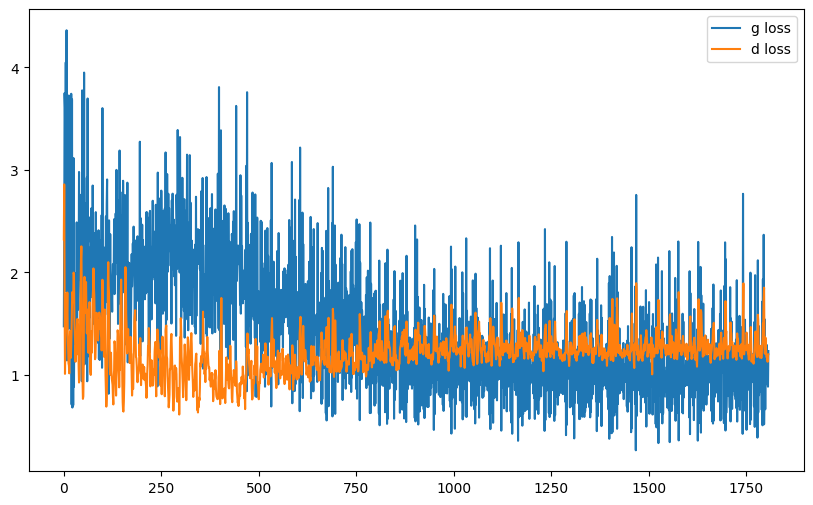

it: 1875; g_loss: 1.141282558441162; d_loss: 1.235851526260376; avg_real_score: 0.6196300387382507; avg_fake_score: 0.5019593238830566: : 469it [01:06,  7.07it/s]
it: 1876; g_loss: 1.2895112037658691; d_loss: 1.1858789920806885; avg_real_score: 0.5760962963104248; avg_fake_score: 0.43061310052871704: : 0it [00:00, ?it/s]

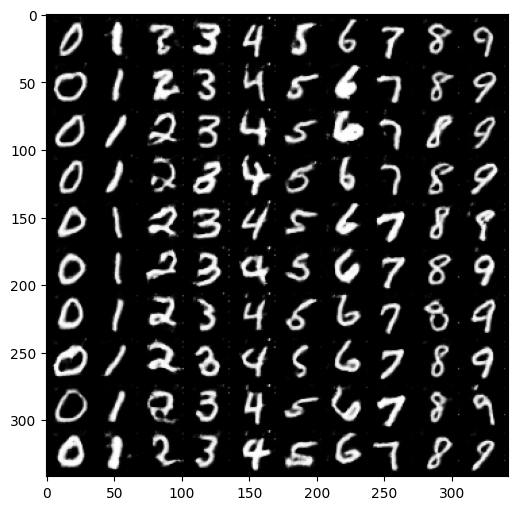

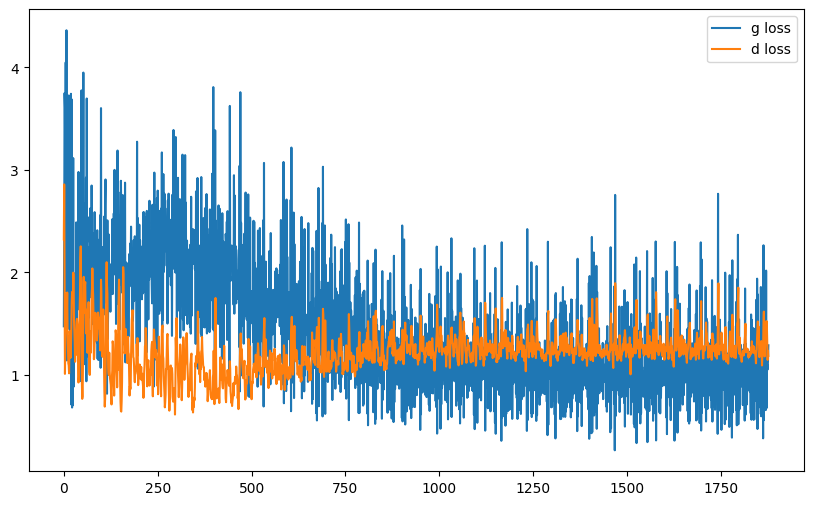

it: 2076; g_loss: 0.7628943920135498; d_loss: 1.1841416358947754; avg_real_score: 0.5064904689788818; avg_fake_score: 0.36181944608688354: : 200it [00:28,  7.60it/s]

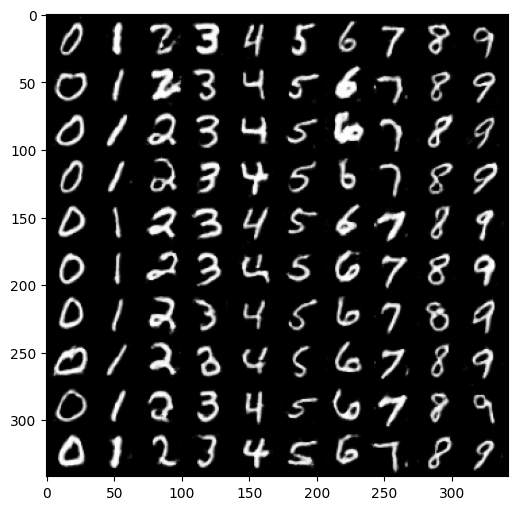

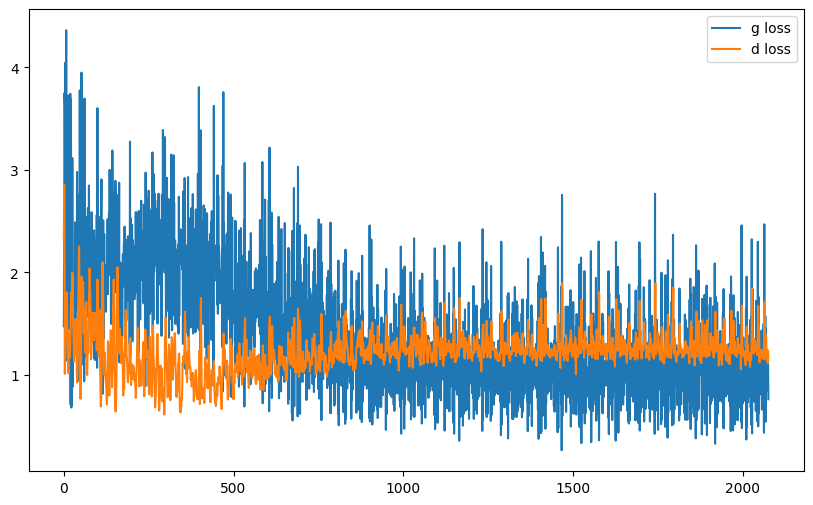

it: 2276; g_loss: 0.9068241119384766; d_loss: 1.0922911167144775; avg_real_score: 0.5076170563697815; avg_fake_score: 0.3015146851539612: : 400it [00:56,  7.46it/s]

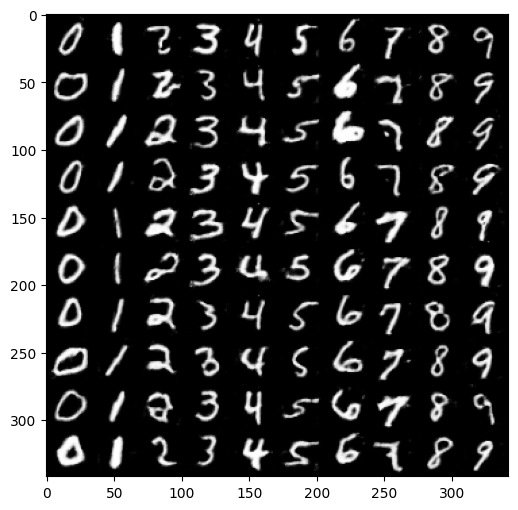

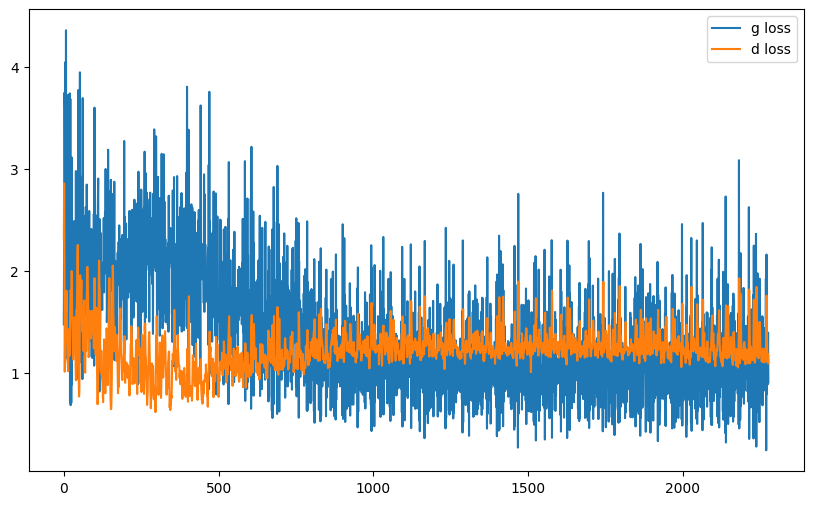

it: 2344; g_loss: 0.6917878985404968; d_loss: 1.1763345003128052; avg_real_score: 0.4635709226131439; avg_fake_score: 0.2902008295059204: : 469it [01:06,  7.01it/s]


In [ ]:
nb_epochs = 5

g_losses = []
d_losses = []

j = 0

z_test = sample_z(100, nz)  # we generate the noise only once for testing


for epoch in range(nb_epochs):

    pbar = tqdm(enumerate(dataloader))
    for i, batch in pbar:
        im, labels = batch
        im = im.to(device)


        y = F.one_hot(labels).float().to(device)

        cur_batch_size = im.shape[0]

        # 1. sample a z vector
        z = sample_z(cur_batch_size, nz)

        # 2. Generate a fake image
        fake_im = netG(z, y)

        # 3. Classify real image with D
        yhat_real = netD(im,y)
        labels_real = get_labels_one(cur_batch_size)
        d_loss_real = criterion(yhat_real, labels_real)

        # 4. Classify fake image with D
        yhat_fake = netD(fake_im.detach(), y)  # detach() to avoid backpropagating through the generator
        labels_fake = get_labels_zero(cur_batch_size)
        d_loss_fake = criterion(yhat_fake, labels_fake)


        ###
        ### Discriminator
        ###

        d_loss = d_loss_real + d_loss_fake
        d_opt.zero_grad()
        d_loss.backward(retain_graph=True) # we need to retain graph=True to be able to calculate the gradient in the g backprop
        d_opt.step()


        ###
        ### Generator
        ###

        # Classify fake image with updated D
        yhat_fake_after_update = netD(fake_im, y)
        labels_fake_after_update = get_labels_one(cur_batch_size)

        g_loss = criterion(yhat_fake_after_update, labels_fake_after_update)
        g_opt.zero_grad()
        g_loss.backward()
        g_opt.step()


        # Save Metrics

        d_losses.append(d_loss.item())
        g_losses.append(g_loss.item())

        avg_real_score = yhat_real.mean().item()
        avg_fake_score = yhat_fake.mean().item()

        pbar.set_description(f"it: {j}; g_loss: {g_loss}; d_loss: {d_loss}; avg_real_score: {avg_real_score}; avg_fake_score: {avg_fake_score}")

        if i % display_freq == 0:
            labels = torch.arange(0, 10).expand(size=(10, 10)).flatten().to(device)
            y = F.one_hot(labels).float().to(device)
            fake_im = netG(z_test, y)

            un_norm = renorm(fake_im) # for visualization

            grid = torchvision.utils.make_grid(un_norm, nrow=10)
            pil_grid = to_pil(grid)

            plt.imshow(pil_grid)
            plt.show()


            plt.plot(range(len(g_losses)), g_losses, label='g loss')
            plt.plot(range(len(g_losses)), d_losses, label='d loss')

            plt.legend()
            plt.show()

        j += 1


## 4.2 Testing
Visualization of the impact of z on generation. All digits in the same column have the same noise vector z.

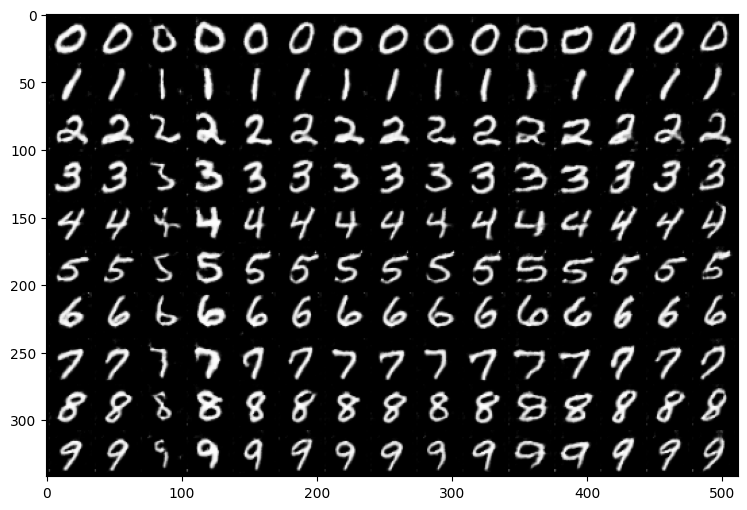

In [ ]:
n_ex = 15
n_classes = 10

z = sample_z(n_ex, nz).repeat(n_classes, 1) #.expand(10, nz)

netG.eval()

labels = torch.arange(n_classes).unsqueeze(0).reshape(-1, 1).repeat(1, n_ex).flatten().to(device)

ys = F.one_hot(labels).float()
fake_ims = netG(z, ys)

un_norm= renorm(fake_ims) # for visualization
grid = torchvision.utils.make_grid(un_norm, nrow=n_ex)
pil_grid = to_pil(grid)

plt.imshow(pil_grid)
plt.show()
